In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image

# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.metrics import (roc_auc_score, recall_score, f1_score, precision_score,
                            accuracy_score)


import warnings; warnings.filterwarnings('ignore')


# Содержание
- [0. Используемые функции](#0.-Используемые-функции)
- [1. Загрузка и предобработка данных](#1.Загрузка-и-предобработка-данных)
- [2. Простейшие методы](#2.-Простейшие-методы)
    - [2.1 3-сигмы](#2.1-3-сигмы)
    - [2.2 Межквартильное отклонение](#2.2-Межквартильное-отклонение)
- [3. Кластеризация](#3.-Кластеризация)
    - [3.1 Distance-based](#3.1-Distance-based)
    - [3.2 Density-based (DBSCAN)](#3.2-Density-based-(DBSCAN))
    

- [4. Unsupervised model-based](#4.-Unsupervised-model-based)
    - [4.1-One-Class-SVM](#4.1-One-Class-SVM)
    - [4.2 Isolation Forest](#4.2-Isolation-Forest)
- [5. Финальное сравнение](#5-Финальное-сравнение)
    - [5.1 Все методы вместе](#5.1-Все-методы-вместе)
    - [5.2 Только на основании моделей](#5.2-Только-на-основании-моделей)

- [6. Анализ данных по другим скважинам](#6.-Анализ-данных-по-другим-скважинам)
    - [6.1 Сравнение с аномалиями целевого показателями (вне интервала 2-сигма)](#6.1-Сравнение-с-аномалиями-целевого-показателями-(вне-интервала-2-сигма))
    - [6.2 Сравнение с аномалиями целевого показателями (вне интервала 3-сигма)](#6.2-Сравнение-с-аномалиями-целевого-показателями-(вне-интервала-3-сигма))
    - [6.3 Сравнение с аномалиями за которое проголосовало большинство](#6.3-Сравнение-с-аномалиями-за-которое-проголосовало-большинство)



# 0. Используемые функции
[Содержание](#Содержание)

In [2]:
# используемые функции



# определяем интервалы 2-сигма и 3-сигма
# def sigma_outline(y):
#     y_train_one_id = y
#     two_sigma = pd.Interval(left=float(y_train_one_id.mean() - 2 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 2 * y_train_one_id.std()),closed='both')
#     three_sigma = pd.Interval(left=float(y_train_one_id.mean() - 3 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 3 * y_train_one_id.std()),closed='both')
#     return two_sigma, three_sigma

# добавляем целевой признак аномалии  2-сигма и 3-сигма
def sigma_add(y):
    y_train_one_id = y
    two_sigma = pd.Interval(left=float(y_train_one_id.mean() - 2 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 2 * y_train_one_id.std()),closed='both')
    three_sigma = pd.Interval(left=float(y_train_one_id.mean() - 3 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 3 * y_train_one_id.std()),closed='both')
    y['2sigma'] = [ 0 if x in two_sigma else 1 for x in y['targ_press_h']]
    y['3sigma'] = [ 0 if x in three_sigma else 1 for x in y['targ_press_h']]
    return print(f""" 2sigma outlined: {len(y[y['2sigma'] == 1])} of {len(y)} 
 3sigma outlined: {len(y[y['3sigma'] == 1])} of {len(y)}""")



    


# 1.Загрузка и предобработка данных
[Содержание](#Содержание)

In [3]:
data_raw = pd.read_csv('C:/Users/Peter/Documents/GitHub/project/cfp_dataset_v1.csv')

data_valid_raw = pd.read_csv('C:/Users/Peter/Documents/GitHub/project/cfp_dataset_v1_valid1.csv')

data_raw.drop(['Unnamed: 0','MIDUPT1138P2300058',
               'SHORTUPT1138P2300058', 'LONGUPT1138P2300058', 'T1013P500399'], axis=1, inplace=True)
data_valid_raw.drop(['Unnamed: 0','MIDUPT1138P2300058',
               'SHORTUPT1138P2300058', 'LONGUPT1138P2300058', 'T1013P500399'], axis=1, inplace=True)

data_raw.rename(columns={
    'T1138P6000096': "engine", 
 'T1138P6000315': "«engine_idle",
 'DMIDT1138P4000064': "workload_сh_d",
 'DSHORTT1138P4000064': "workload_сh_h",
 'DLONGT1138P4000064': "workload_сh_w",
 'DMIDT1138P2600012': "curr_сh_d",
 'DSHORTT1138P2600012': "curr_сh_h",
 'DLONGT1138P2600012': "curr_сh_w",
'DMIDT1205P2300000': "press_сh_d»",
 'DSHORTT1205P2300000': "press_сh_h»",
 'DLONGT1205P2300000': "press_сh_w",
'T1205P2300000': "press_coll",
 'T1138P4000064': "workload_eng",
 'T1138P2600012': "curr",
 'T1138P600050': "power_coef",
 'T1013P500399': "liq",
 'DMIDT1138P2300058': "targ_press_d",
 'DSHORTT1138P2300058': "targ_press_h",
 'DLONGT1138P2300058': "targ_press_w"
                  }, inplace=True)

data_raw.drop(['UUID','UNIXDT'], axis=1, inplace=True)

data_raw['DT'] = pd.to_datetime(data_raw['DT'])
data_valid_raw['DT'] = pd.to_datetime(data_valid_raw['DT'])


data_valid_raw.rename(columns={
    'T1138P6000096': "engine", 
 'T1138P6000315': "«engine_idle",
 'DMIDT1138P4000064': "workload_сh_d",
 'DSHORTT1138P4000064': "workload_сh_h",
 'DLONGT1138P4000064': "workload_сh_w",
 'DMIDT1138P2600012': "curr_сh_d",
 'DSHORTT1138P2600012': "curr_сh_h",
 'DLONGT1138P2600012': "curr_сh_w",
'DMIDT1205P2300000': "press_сh_d»",
 'DSHORTT1205P2300000': "press_сh_h»",
 'DLONGT1205P2300000': "press_сh_w",
'T1205P2300000': "press_coll",
 'T1138P4000064': "workload_eng",
 'T1138P2600012': "curr",
 'T1138P600050': "power_coef",
 'T1013P500399': "liq",
 'DMIDT1138P2300058': "targ_press_d",
 'DSHORTT1138P2300058': "targ_press_h",
 'DLONGT1138P2300058': "targ_press_w"
                  }, inplace=True)

data_valid_raw.drop(['UUID','UNIXDT'], axis=1, inplace=True)



#проверим пропуски
{key:data_raw[key].isna().sum() for key in data_raw.columns}




{'WELL_ID': 0,
 'DT': 0,
 'engine': 0,
 '«engine_idle': 0,
 'workload_сh_d': 0,
 'workload_сh_h': 0,
 'workload_сh_w': 0,
 'curr_сh_d': 0,
 'curr_сh_h': 0,
 'curr_сh_w': 0,
 'press_сh_d»': 0,
 'press_сh_h»': 0,
 'press_сh_w': 0,
 'press_coll': 1,
 'workload_eng': 0,
 'curr': 0,
 'power_coef': 0,
 'targ_press_d': 0,
 'targ_press_h': 0,
 'targ_press_w': 0}

'T1138P6000096': "Наработка двигателя с момента последнего включения, сек"  **engine**  
'T1138P6000315': "«Время простоя двигателя с момента последнего выключения, сек", **engine_idle**    
'DMIDT1138P4000064': "Средняя скорость изменения загрузки двигателя СУТ, %/час",  **workload_сh_d**  
'DSHORTT1138P4000064': "Средняя скорость изменения загрузки двигателя ЧАС, %/час",  **workload_сh_h**  
'DLONGT1138P4000064': "Средняя скорость изменения загрузки двигателя НЕДЕЛЯ, %/час",  **workload_сh_w**  
'DMIDT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в СУТ, А/час",  **curr_сh_d**  
'DSHORTT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в ЧАС, А/час",  **curr_сh_h**  
'DLONGT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в НЕДЕЛЯ, А/час", **curr_сh_w**   
'DMIDT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в СУТ, МПа/час»", **press_сh_d**   
'DSHORTT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в ЧАС, МПа/час»",  **press_сh_h**  
'DLONGT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в НЕДЕЛЯ, МПа/час»",  **press_сh_w**  
'T1205P2300000': "Давление в коллекторе измерительной установки, МПа",  **press_coll**  
'T1138P4000064': "Загрузка двигателя, %",  **workload_eng**  
'T1138P2600012': "Ток фазы A двигателя, А",  **curr**  
'T1138P600050': "Коэффициент мощности (cos fi)",  **power_coef**  
'T1013P500399': "Объём жидкости в рабочих условиях за время наработки суточный, м3",  **liq**  
'DMIDT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса в СУТ, МПа/час", **targ_press_d**   
'DSHORTT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса в ЧАС, МПа/час",  **targ_press_h**  
'DLONGT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса НЕДЕЛЯ, МПа/час"  **targ_press_w**  

<AxesSubplot:>

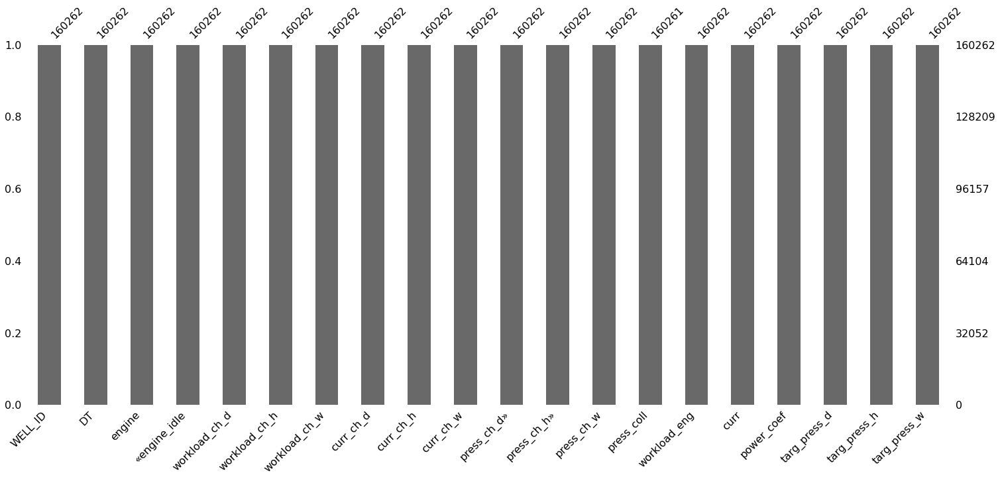

In [4]:
#выводим данные на график, чтобы визуально просмотреть наличие пропусков и сколько пропусков в данных
msno.bar(data_raw)

In [5]:
# увидели что пропущено только одно значение, заполним его средним
median_press = data_raw['press_coll'].median()
data_raw['press_coll'].fillna(median_press, inplace=True)

In [6]:
wells = list(set(data_raw['WELL_ID']))
wells

[226003330,
 226003074,
 226002627,
 226002307,
 226002148,
 226000198,
 226003080,
 226000297,
 226002603,
 226002861,
 226002416,
 226003316,
 226002998,
 226001846,
 226001947,
 226000188,
 226002142]

In [7]:
# дальше работаем с входными данными, преобразовывая их для удобства дальнейшей обработки

data_prep = data_raw.copy()
data_valid_prep = data_valid_raw.copy()

data_prep['hour'] = data_prep['DT'].dt.hour
data_prep['day_w'] = data_prep['DT'].dt.dayofweek
data_prep['minute'] = data_prep['DT'].dt.minute


data_valid_prep['hour'] = data_valid_prep['DT'].dt.hour
data_valid_prep['day_w'] = data_valid_prep['DT'].dt.dayofweek
data_valid_prep['minute'] = data_valid_prep['DT'].dt.minute


data_prep.set_index(['WELL_ID','DT'],inplace=True)
data_valid_prep.set_index(['WELL_ID','DT'],inplace=True)

data_prep = data_prep.sort_index()
data_valid_prep = data_valid_prep.sort_index()

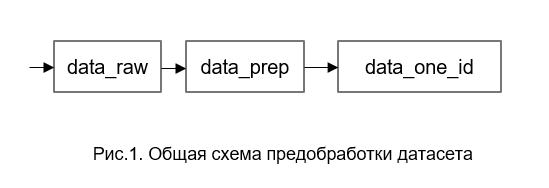

In [8]:
data_one_id = data_prep.xs(226000188, level='WELL_ID')
data_one_id = data_one_id.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)
data_one_id

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute
DT,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,13200,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.648583,0,0.000000,0.000,6,3,40
2019-06-27 06:45:00,0,13500,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.681818,0,0.000000,0.000,6,3,45
2019-06-27 06:50:00,0,13800,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.650049,0,0.000000,0.000,6,3,50
2019-06-27 06:55:00,0,14100,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.648583,0,0.000000,0.000,6,3,55
2019-06-27 07:00:00,0,14400,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.642718,0,0.000000,0.000,7,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,3000,0,-5.609132,-21.079881,-4.387931,-0.611832,-2.678454,-0.518866,0.015839,0.007317,0.006937,1.514174,46,18.299999,0.554,23,2,35
2019-07-31 23:40:00,3300,0,-5.553041,-18.971893,-4.383543,-0.617713,-2.530606,-0.519547,0.015916,0.008931,0.006953,1.516129,46,18.200001,0.554,23,2,40
2019-07-31 23:45:00,3600,0,-5.617511,-18.274703,-4.391160,-0.611536,-2.277545,-0.519028,0.015757,0.008038,0.006946,1.516129,45,18.200001,0.541,23,2,45


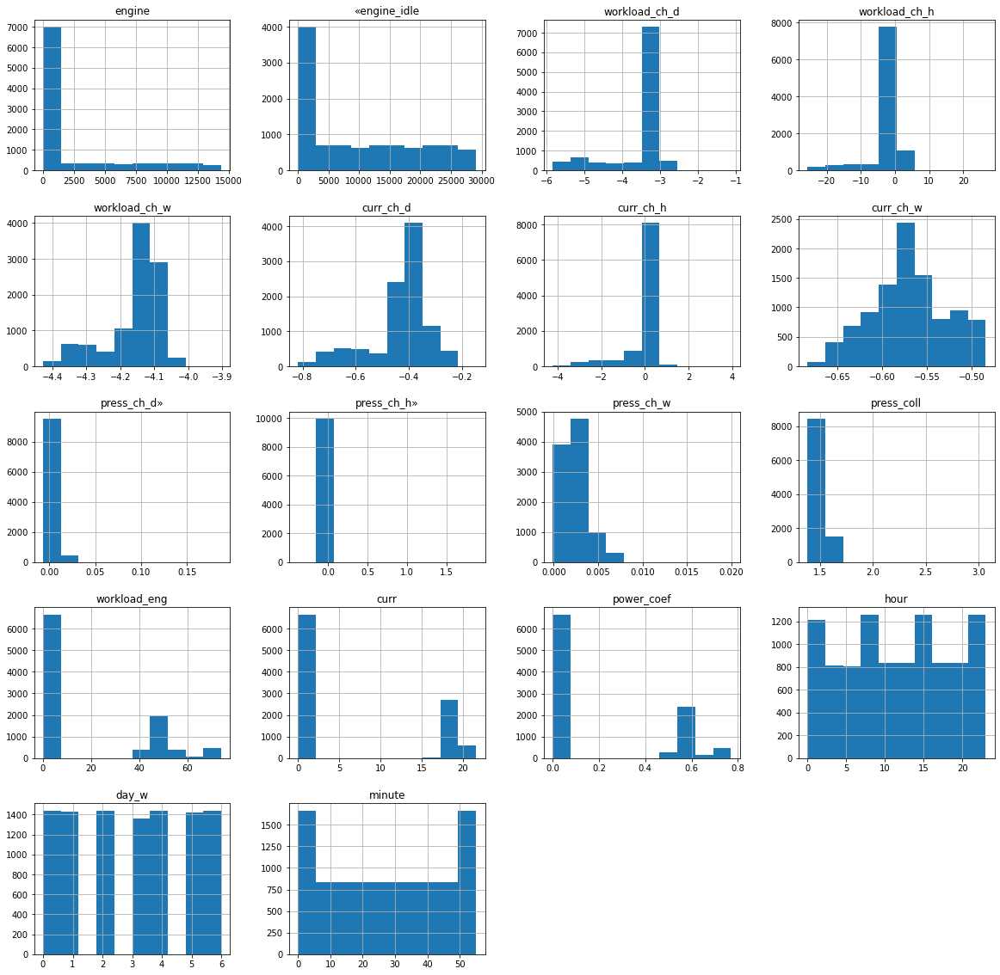

In [9]:
data_one_id.hist(figsize=(20, 20));


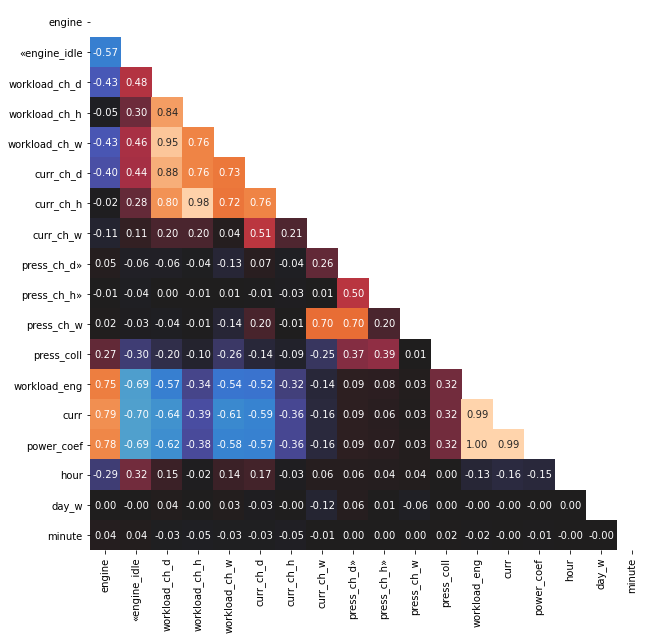

In [10]:
plt.figure(figsize=(10,10))

corr_matrix = data_one_id.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(np.bool))

sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0);

In [11]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.6)|(lower[column] < -0.6))
]
high_corr

['engine',
 '«engine_idle',
 'workload_сh_d',
 'workload_сh_h',
 'workload_сh_w',
 'curr_сh_d',
 'curr_сh_w',
 'press_сh_d»',
 'workload_eng',
 'curr']

In [12]:
other_features = [col for col in data_one_id.columns if col not in high_corr and col!='quality']


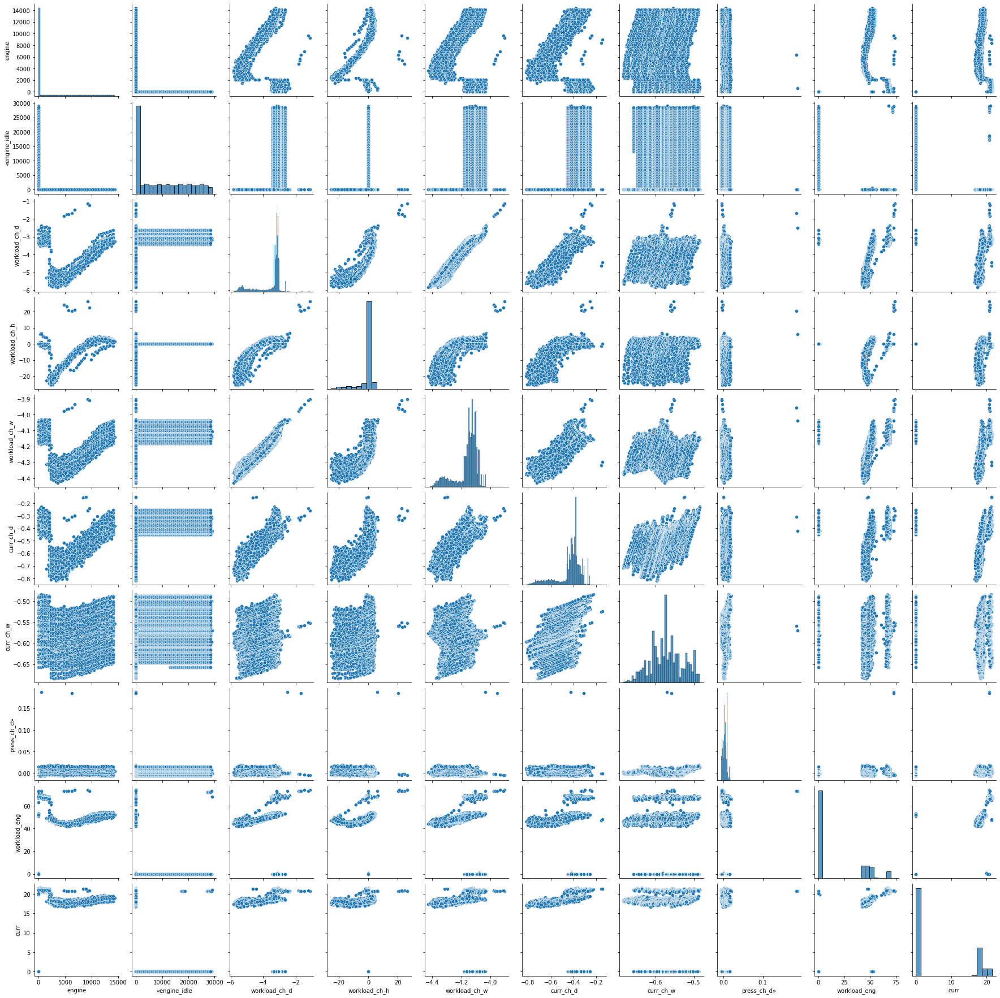

In [13]:
sns.pairplot(data_one_id[high_corr])


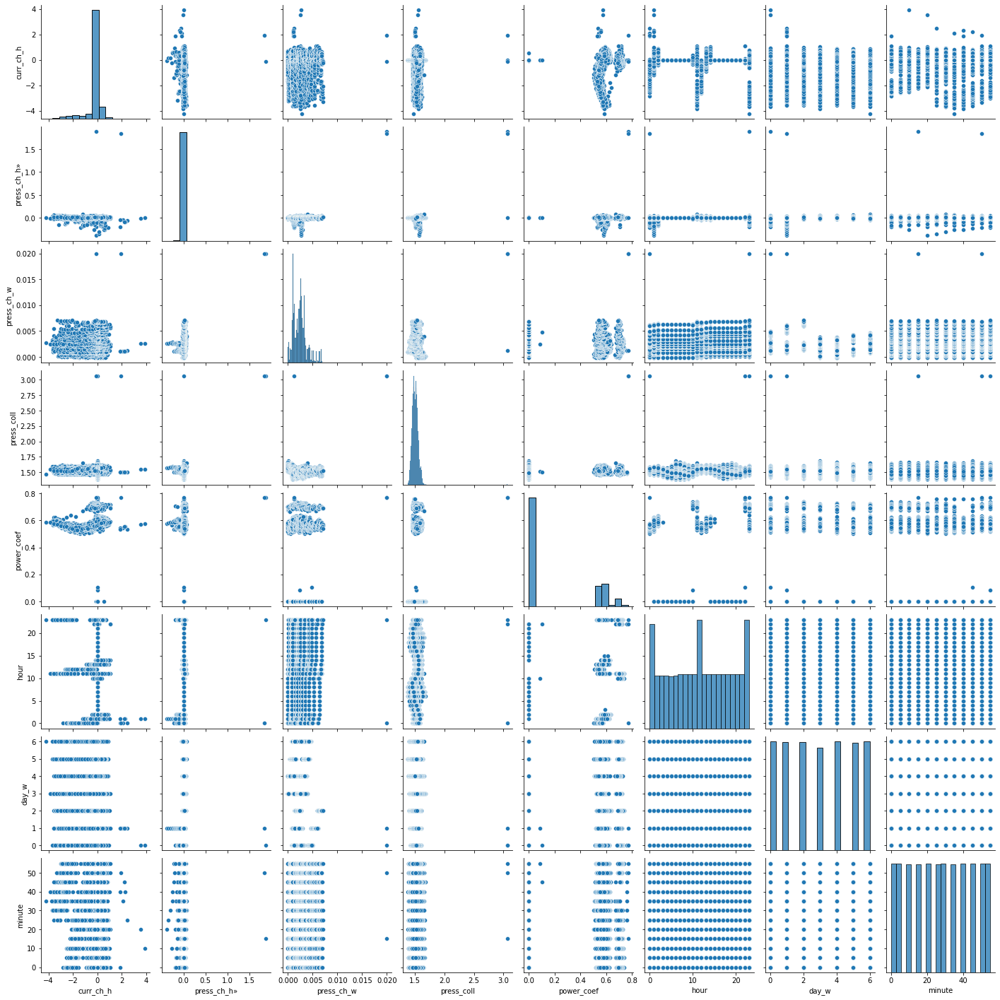

In [14]:
sns.pairplot(data_one_id[other_features])

## 2. Простейшие методы
[Содержание](#Содержание)

## 2.1 3-сигмы

In [15]:
def outlier_std(data, col, threshold=3):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [16]:
def get_column_outliers(data, columns=None, function=outlier_std, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns
        
#     outliers = pd.Series(data=[False]*len(data), index=data_features.index, name='is_outlier')
    outliers = pd.Series(data=[False]*len(data), index=data.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True
    
    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    
    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))    

In [17]:
data_features = data_one_id.copy()


In [18]:
comparison_table, std_outliers = get_column_outliers(data_features)
anomalies_report(std_outliers)

Total number of outliers: 647
Percentage of outliers:   6.49%


In [19]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
engine,14571.074345,-9912.367578,0.0,0.000000
«engine_idle,38289.859891,-19169.619289,0.0,0.000000
workload_сh_d,-1.315474,-5.696985,26.0,0.260652
workload_сh_h,13.464937,-16.427673,415.0,4.160401
workload_сh_w,-3.921776,-4.396022,38.0,0.380952
curr_сh_d,-0.103935,-0.760936,82.0,0.822055
curr_сh_h,1.857812,-2.237996,399.0,4.000000
curr_сh_w,-0.446192,-0.695360,0.0,0.000000
press_сh_d»,0.020292,-0.013746,2.0,0.020050
press_сh_h»,0.090718,-0.088292,41.0,0.411028


In [20]:
other_features

['curr_сh_h',
 'press_сh_h»',
 'press_сh_w',
 'press_coll',
 'power_coef',
 'hour',
 'day_w',
 'minute']

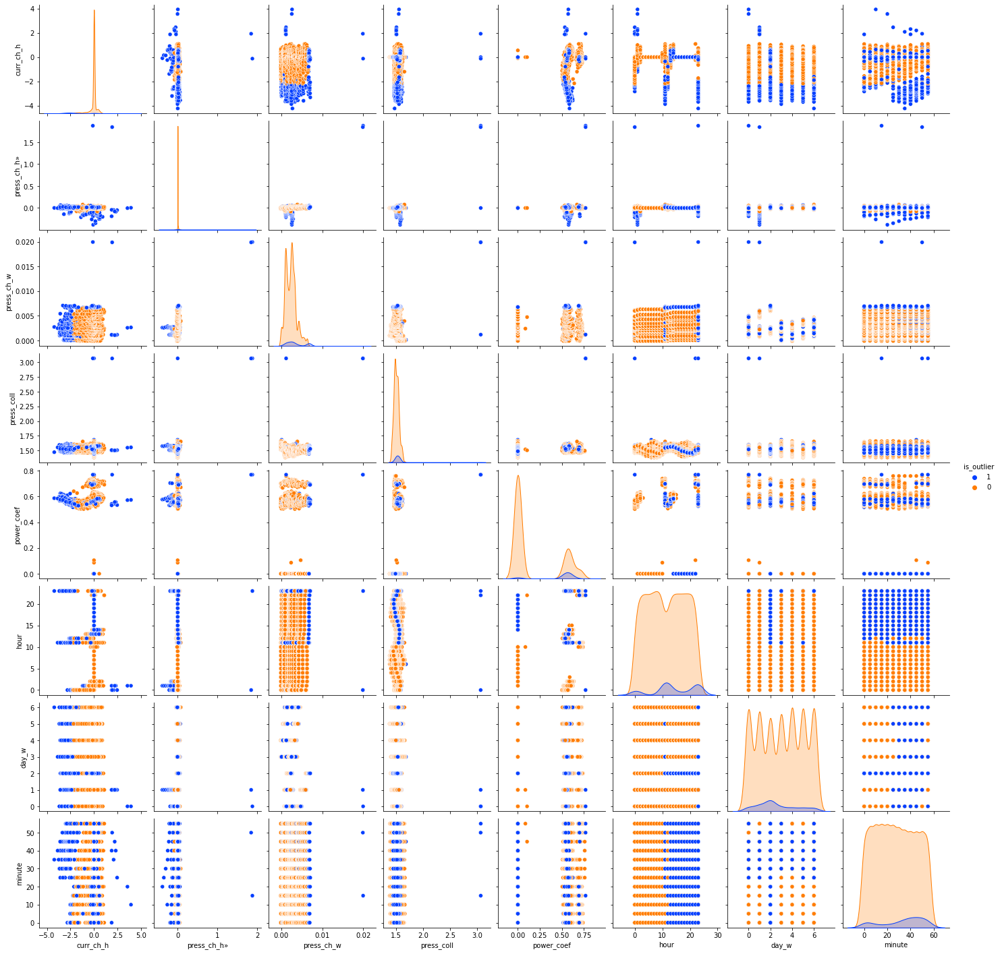

In [21]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             palette='bright');

## 2.2 Межквартильное отклонение
[Содержание](#Содержание)

In [22]:
def outlier_iqr(data, col, threshold=1.5):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

Включить метод, но указать что он не очень хорош (посмотреть строки с нулямя)

In [23]:
comparison_table, iqr_outliers = get_column_outliers(data_features, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 3244
Percentage of outliers:   32.52%


In [24]:
comparison_table, iqr_outliers = get_column_outliers(data_features, function=outlier_iqr, 
                                                     columns=['engine','«engine_idle','workload_сh_w',
                                                              'curr_сh_d','curr_сh_w','press_сh_w',
                                                             'press_coll', 'workload_eng','curr',
                                                             'power_coef', 'hour', 'day_w', 'minute'])
anomalies_report(iqr_outliers)

Total number of outliers: 851
Percentage of outliers:   8.53%


In [25]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
engine,13200.000000,-9900.000000,201.0,2.015038
«engine_idle,72000.000000,-54000.000000,0.0,0.000000
workload_сh_w,-3.907058,-4.369673,188.0,1.884712
curr_сh_d,-0.141574,-0.682175,526.0,5.273183
curr_сh_w,-0.367236,-0.776568,0.0,0.000000
press_сh_w,0.008740,-0.004382,2.0,0.020050
press_coll,1.728250,1.276638,3.0,0.030075
workload_eng,180.000000,-135.000000,0.0,0.000000
curr,71.600000,-53.700000,0.0,0.000000
power_coef,2.212000,-1.659000,0.0,0.000000


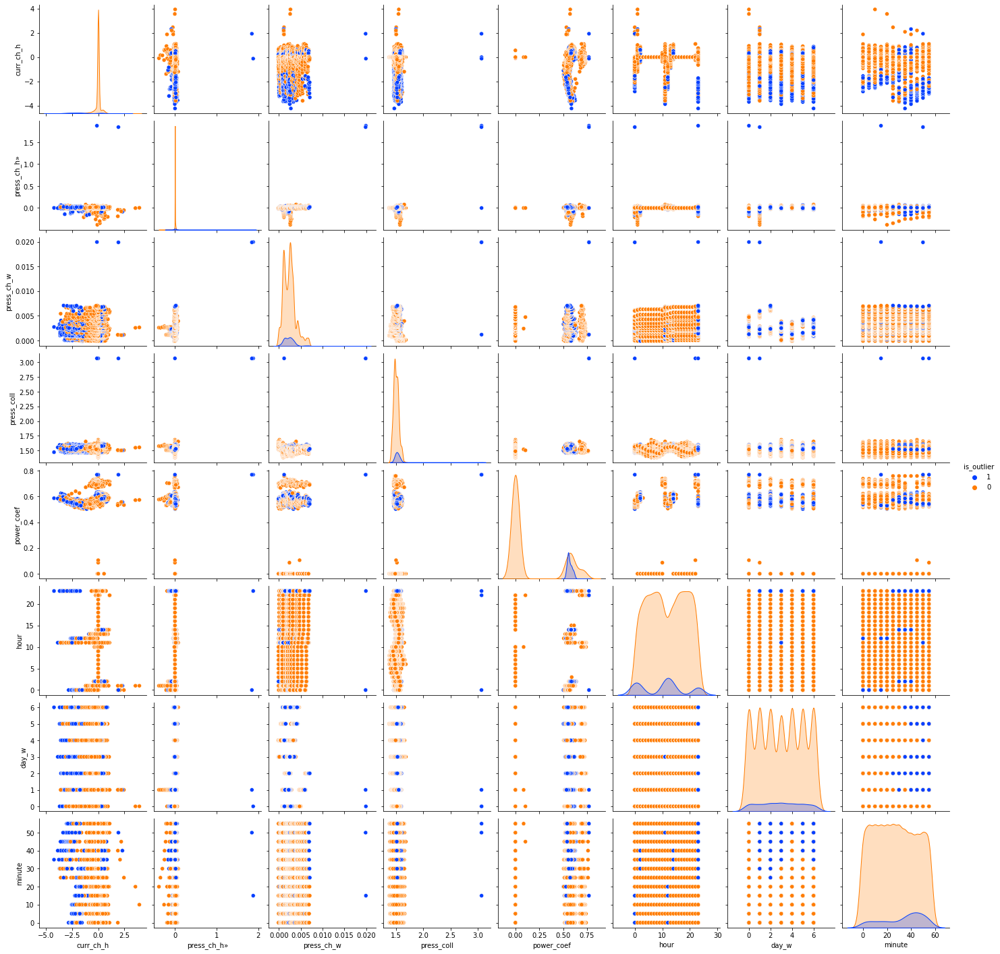

In [26]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = iqr_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             palette='bright');

# 3. Кластеризация
[Содержание](#Содержание)

## 3.1 Distance-based
[Содержание](#Содержание)

In [27]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    """
    Distance based outlier detector model
    
    Fit method calculates centroid of training samples and
    using `metric` get distances from centroid to train samples.
    Having distances - we calculate `threshold` based on `percentile`.
    
    Predict method uses `threshold` and `metric` to determine, whether
    distance to sample from centroid is too large -> outlier.
    
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

In [28]:
scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features), 
    columns=data_features.columns
)

In [29]:
#след надо откорректировать 


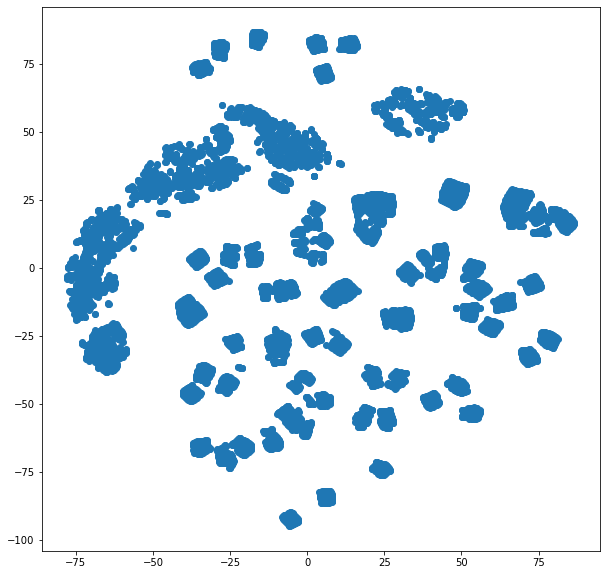

In [37]:
tsne = TSNE(perplexity=50, n_jobs=-1)
tsne_transformed = tsne.fit_transform(scaled_data)

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1]);

In [31]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=90)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)
anomalies_report(euclidian_outliers)

Total number of outliers: 998
Percentage of outliers:   10.01%


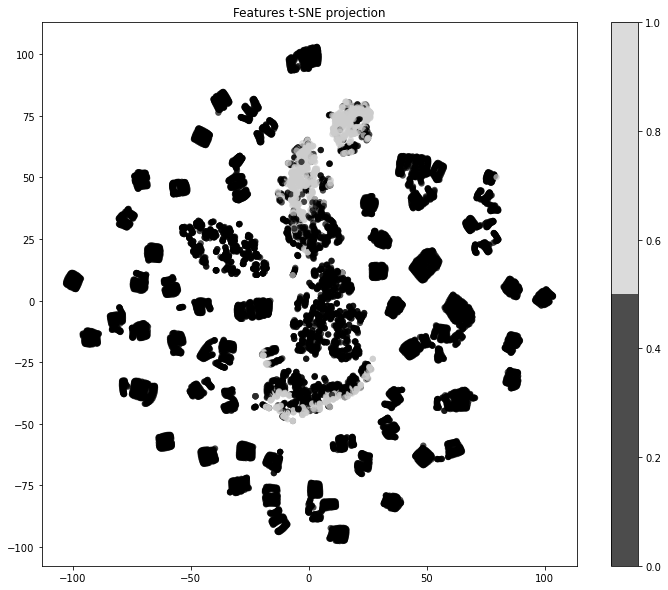

In [32]:
# Визуализация цифр из набора MNIST при помощи t-SNE.
from sklearn.manifold import TSNE
tsne = TSNE(random_state=17)
X_tsne = tsne.fit_transform(scaled_data)

colors = labeled_data['is_outlier']

plt.figure(figsize=(12,10))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colors, 
            edgecolor='none', alpha=0.7, s=40,
            cmap=plt.cm.get_cmap('nipy_spectral', 2))
plt.colorbar()
plt.title('Features t-SNE projection');

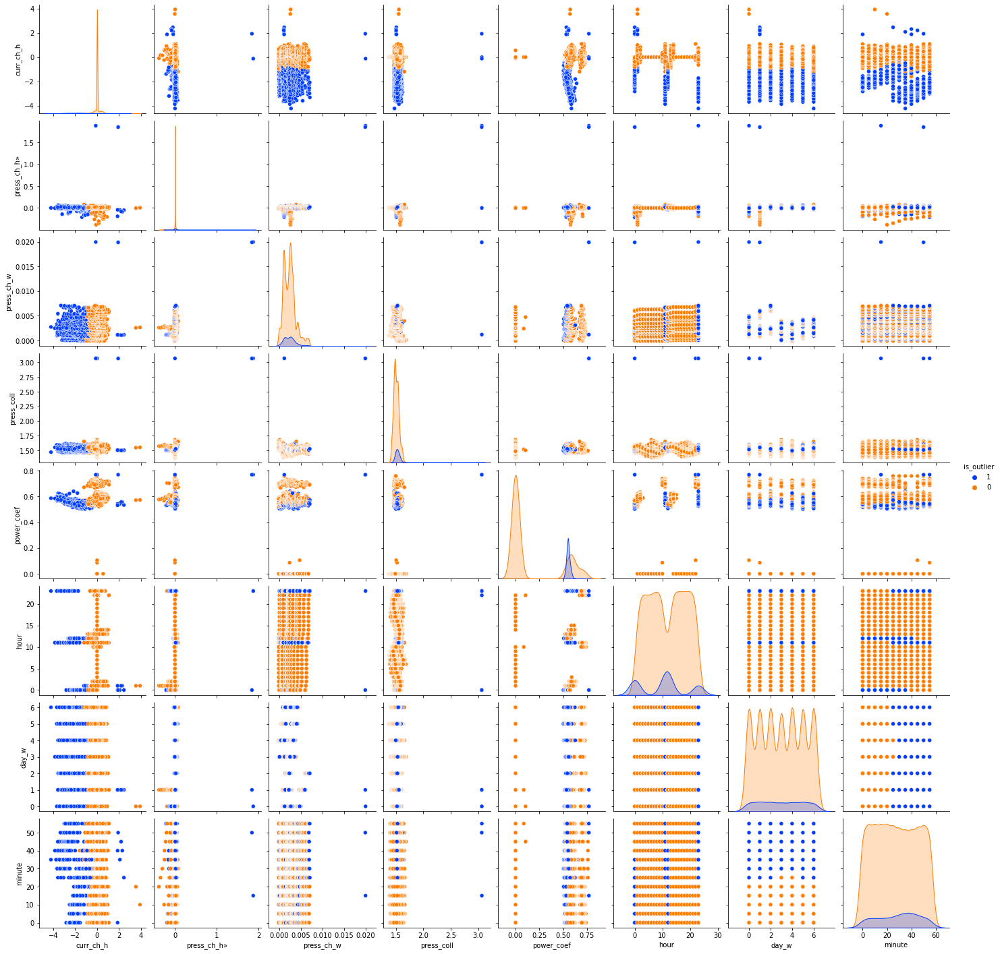

In [33]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = euclidian_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             palette='bright');

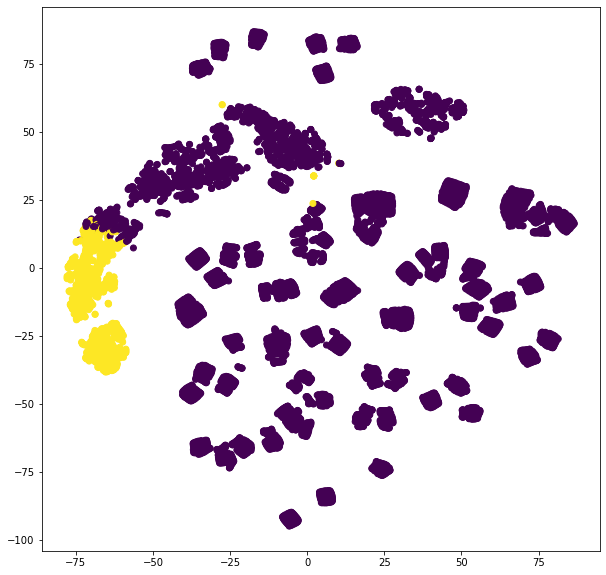

In [39]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

Total number of outliers: 998
Percentage of outliers:   10.01%


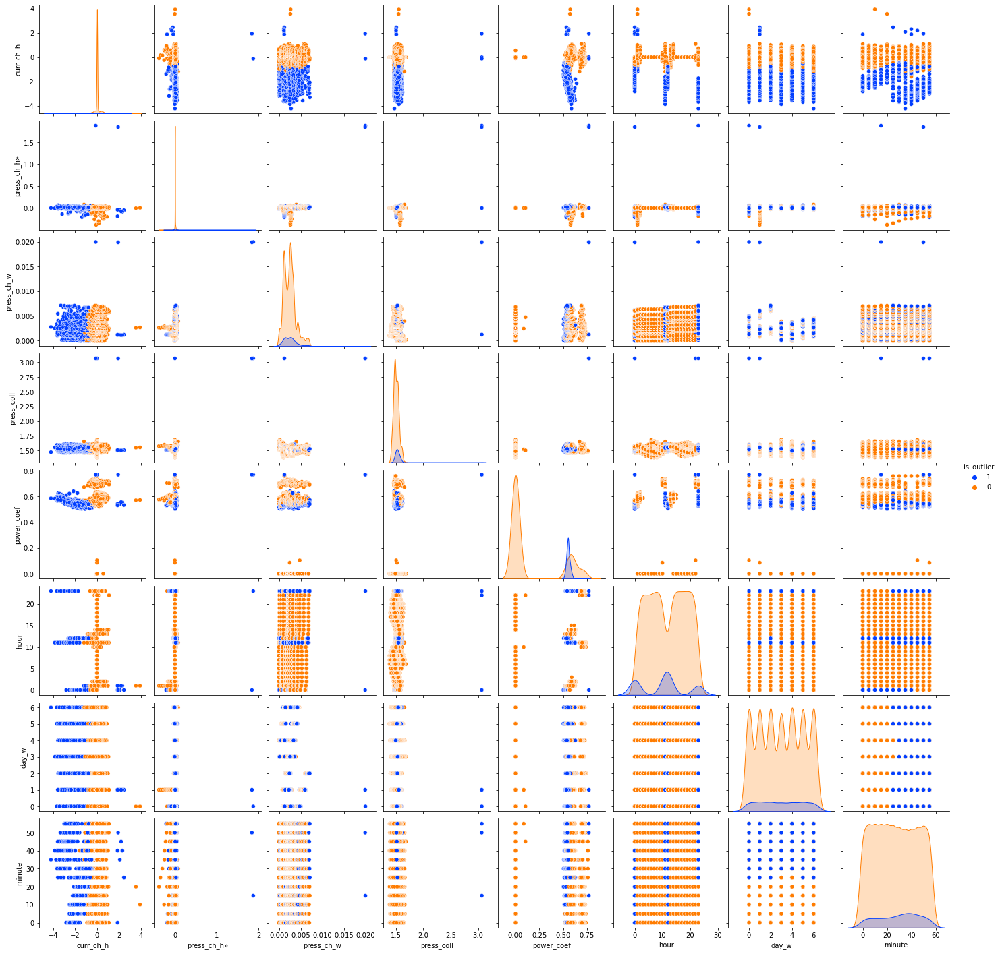

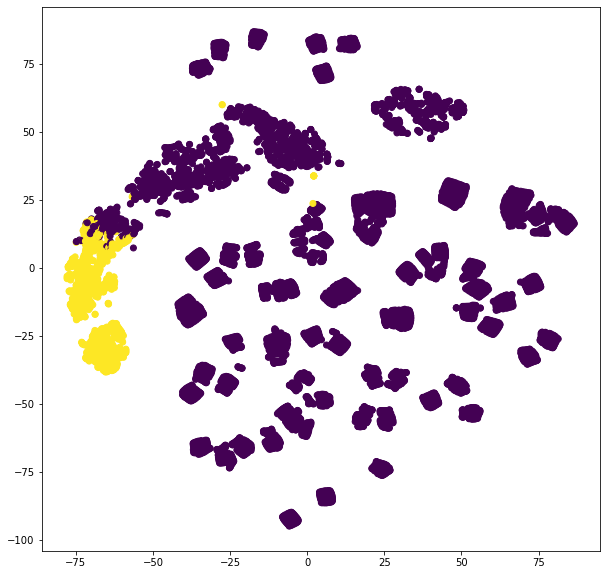

In [40]:
citiblock_model = DistanceOutliers(metric='cityblock', percentile=90)
citiblock_model.fit(scaled_data)
cityblock_outliers = citiblock_model.predict(scaled_data)
anomalies_report(cityblock_outliers)

labeled_data = data_features.copy()
labeled_data['is_outlier'] = cityblock_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             palette='bright');

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=cityblock_outliers);

## 3.2 Density-based (DBSCAN)
[Содержание](#Содержание)

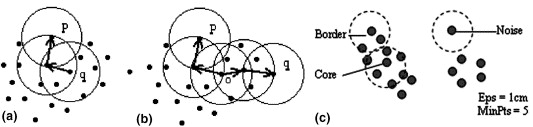

Алгоритм:

Выбираем случайную точку и находим её соседей в заданной окрестности
Если соседей меньше критического значения – называем выбросами
Если больше – объединяем в «плотный» кластер и повторяем поиск соседей
Если все плотные точки пройдены и помечены как посещенные – выбираем новую не посещенную точку и начинаем сначала
Повторяем, пока все точки не будут посещены

Преимущества:

Density-based (плотностной/вероятностный) метод – умеет формировать сложные формы кластеров
Поиск выбросов и аномалий в данных

Недостатки:

Довольно сложный в настройке – очень чувствителен к параметру ”плотности” epsilon
Идея - аномалии должны сильно отличаться от основных данных и скорее всего попадут в "шум". Почему бы не увеличивать epsilon до тех пор, пока все "плотные" данные не окажутся в нескольких немногочисленных кластерах, а шума будет столько, сколько мы подозреваем должно быть аномалий

Источник: https://doi.org/10.1016/j.datak.2006.01.013

In [41]:
from sklearn.cluster import DBSCAN

# для начала считаем все наблюдения аномальными
outlier_percentage = 1.

num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.05
eps_history = [eps]
while outlier_percentage>0.05:    
    model = DBSCAN(eps=eps).fit(scaled_data)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # считаем текущий процент "шума"
    outlier_percentage = sum(labels==1) / len(labels)    
    eps += 0.05
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)
    
model = DBSCAN(eps)
model.fit(scaled_data)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [42]:
model = DBSCAN(1.3)
model.fit(scaled_data)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [43]:
anomalies_report(density_outlier)


Total number of outliers: 469
Percentage of outliers:   4.70%


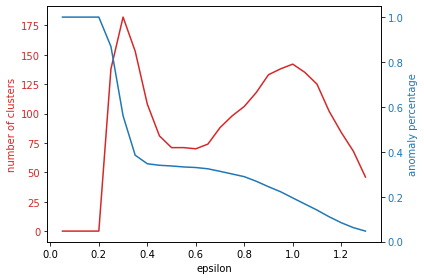

In [44]:
iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('epsilon')
ax1.set_ylabel('number of clusters', color=color)
ax1.plot(iterations, num_clusters, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('anomaly percentage', color=color)  # we already handled the x-label with ax1
ax2.plot(iterations, anomaly_percentage, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

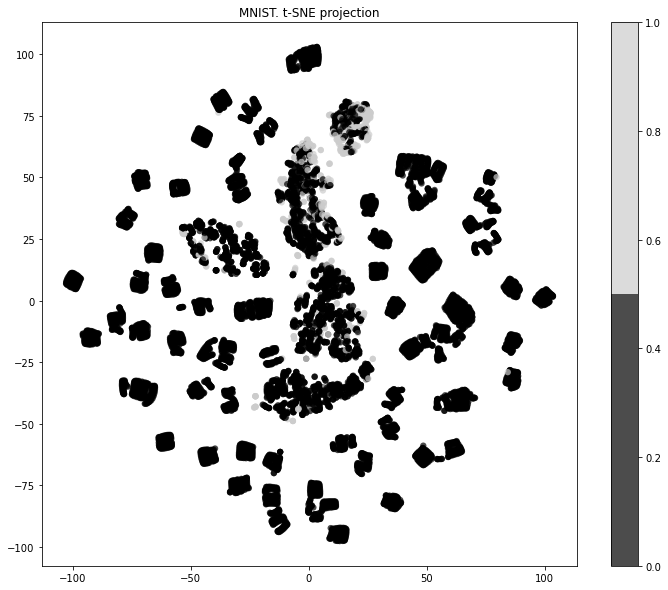

In [45]:
colors = density_outlier.copy()

plt.figure(figsize=(12,10))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colors, 
            edgecolor='none', alpha=0.7, s=40,
            cmap=plt.cm.get_cmap('nipy_spectral', 2))
plt.colorbar()
plt.title('MNIST. t-SNE projection');

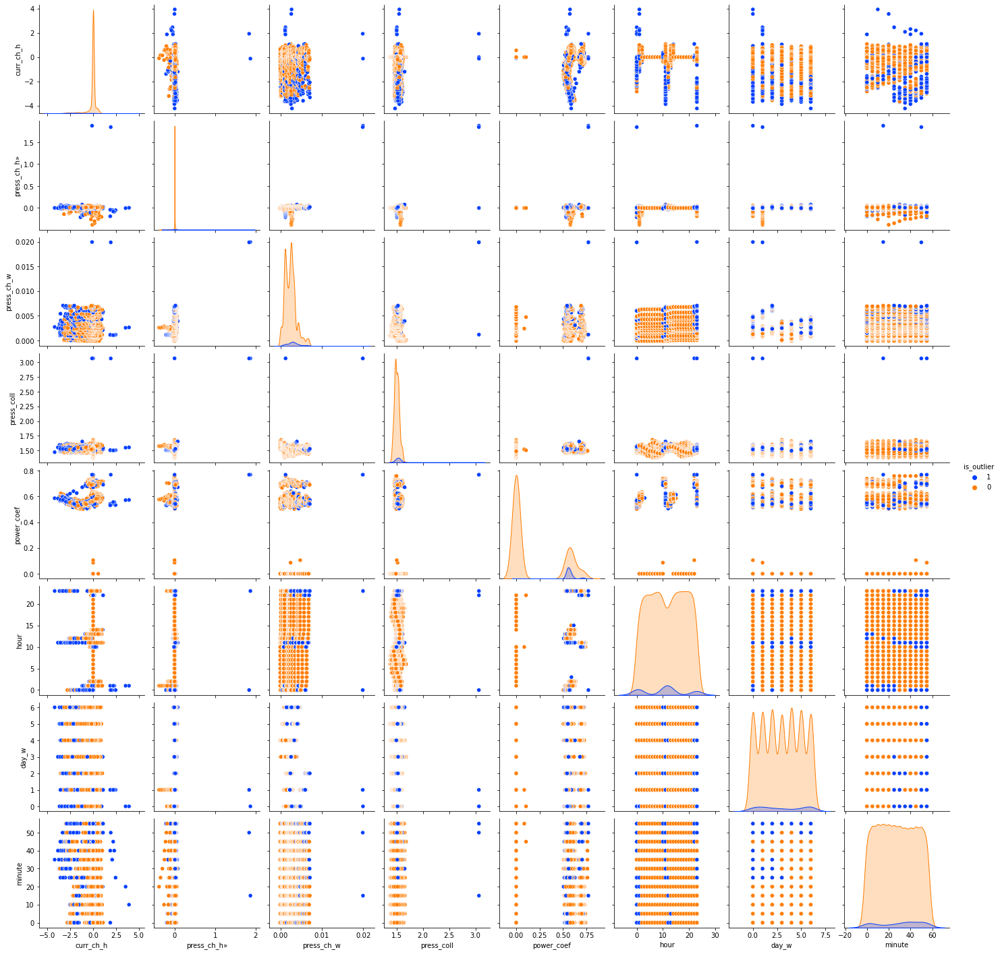

In [46]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outlier


sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'],  
             palette='bright');

# 4. Unsupervised model-based
[Содержание](#Содержание)

## 4.1 One-Class SVM

In [47]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.1, gamma='auto')
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [48]:
anomalies_report(svm_outliers)


Total number of outliers: 1000
Percentage of outliers:   10.03%


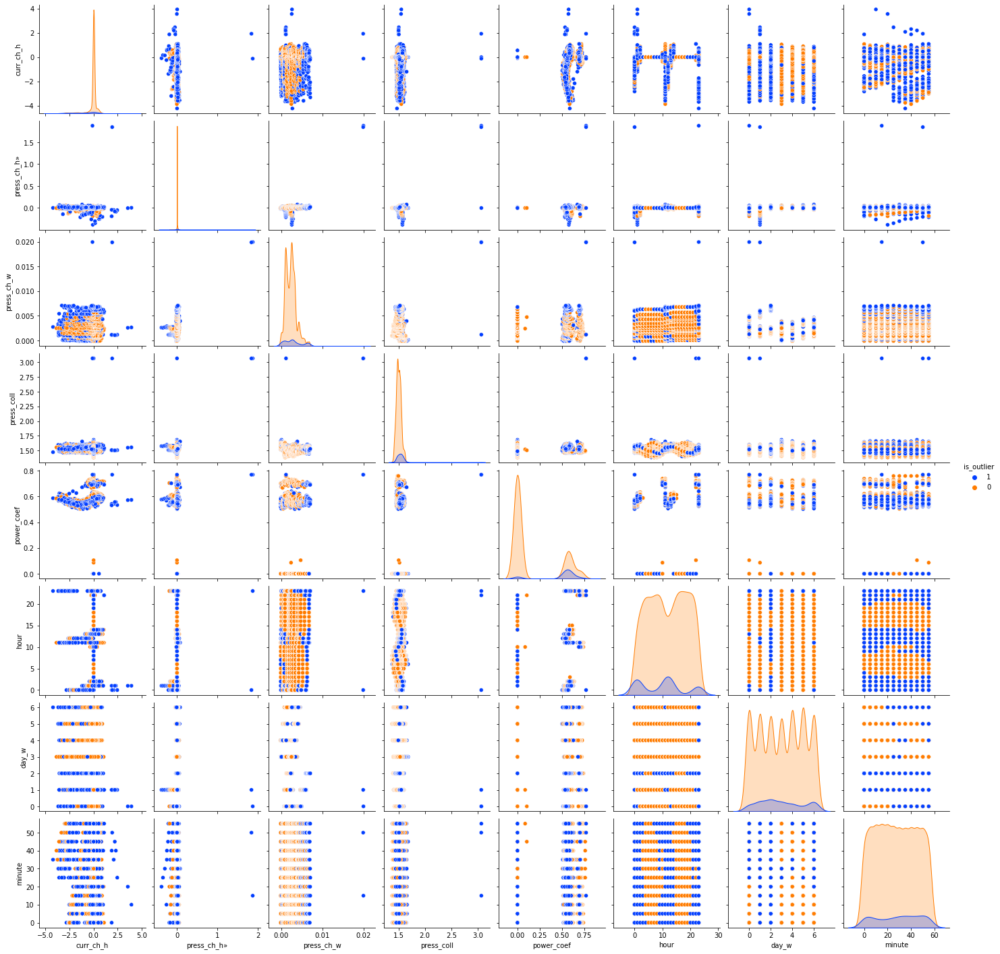

In [49]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = svm_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'],
             palette='bright');

## 4.2 Isolation Forest
[Содержание](#Содержание)


In [50]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, contamination=0.1, 
                                   max_features=1.0, bootstrap=True, behaviour="new")
isolation_forest.fit(scaled_data)

isolation_outliers = isolation_forest.predict(scaled_data)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

In [51]:
anomalies_report(isolation_outliers)


Total number of outliers: 998
Percentage of outliers:   10.01%


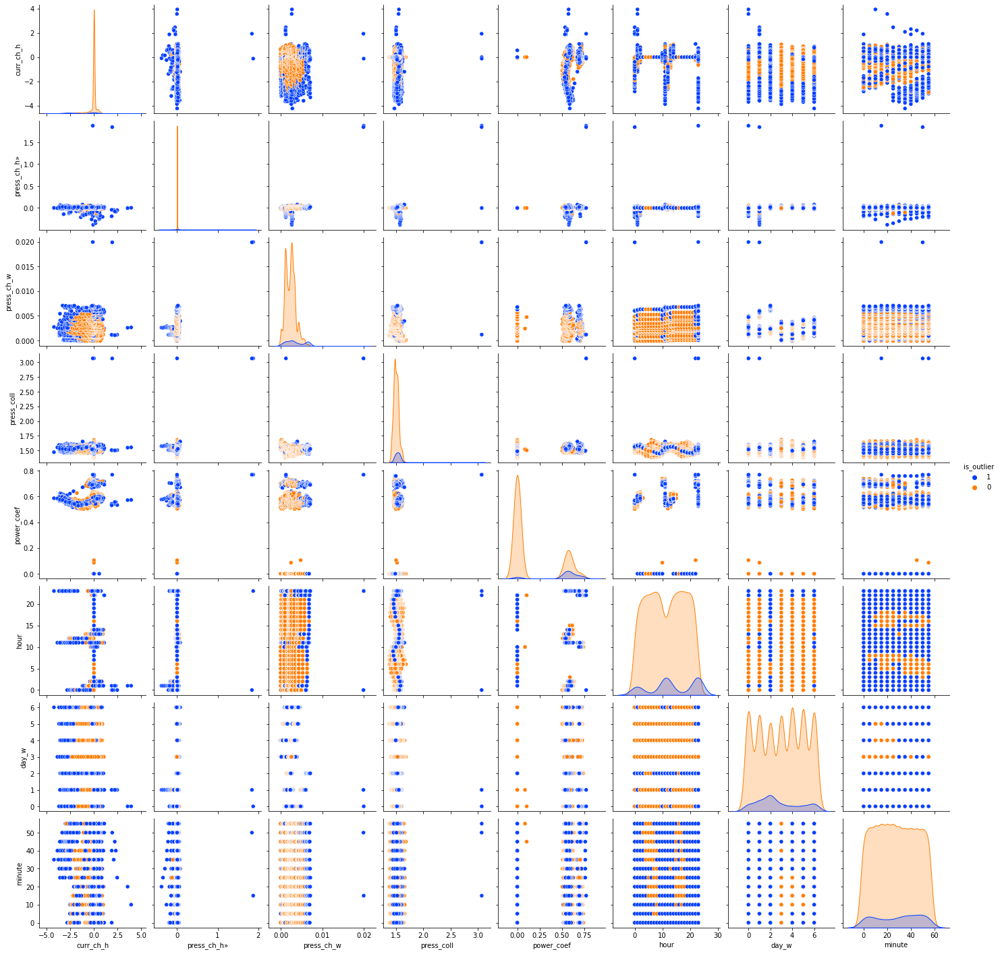

In [52]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = isolation_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             palette='bright');

# 5 Финальное сравнение
[Содержание](#Содержание)


In [53]:
summary = np.concatenate((
    [std_outliers], 
    [iqr_outliers], 
    [euclidian_outliers], 
#     [cityblock_outliers],
    [density_outlier],
    [svm_outliers],
    [isolation_outliers]
))

In [54]:
summary = pd.DataFrame(
    summary.T, 
    columns=['std', 'iqr', 'euclid', 
#              'cityblock',
             'dbscan', 'svm', 'isolation']
)
summary.head()

,std,iqr,euclid,dbscan,svm,isolation
0,0,0,0,0,1,0
1,1,0,0,0,1,0
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,0,0,0,0,1,0


In [55]:
summary.sum(axis=1).value_counts()


0    7922
1     799
2     488
3     258
4     230
5     174
6     104
dtype: int64

<AxesSubplot:>

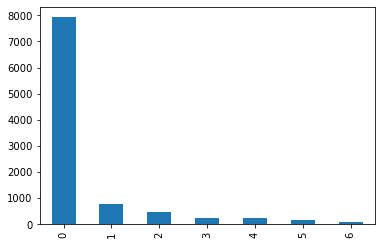

In [56]:
summary.sum(axis=1).value_counts().plot(kind='bar')

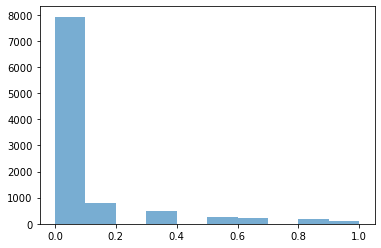

In [57]:
outlier_score = summary.mean(axis=1)
plt.hist(outlier_score, alpha=0.6);

## 5.1 Все методы вместе
[Содержание](#Содержание)

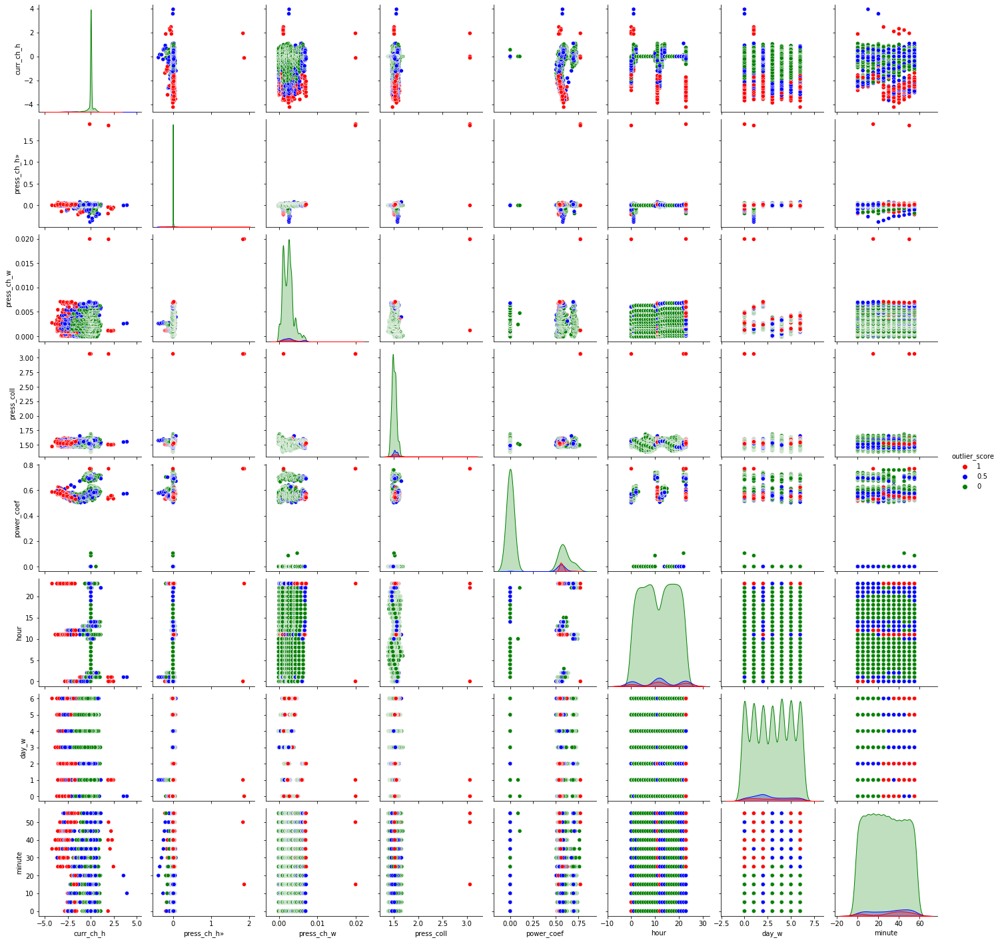

In [58]:
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 0.5 if x < 0.8 else 1)

labeled_data = data_features.copy()
# labeled_data['outlier_score'] = simple_score


#мэппим два датафрейма с одинаковой формой, но разным индексом
simple_score_index = list(zip(labeled_data.index, simple_score))
simple_score_index = pd.DataFrame(simple_score_index).set_index(0)
simple_score_index.rename(columns = {1: 'outlier_score'}, inplace = True)

labeled_data['outlier_score'] = np.round(simple_score_index,1)


custom_palette = {0:'g', 0.5:'b', 1.0:'r'}

sns.pairplot(data=labeled_data, vars=other_features, 
             hue='outlier_score',
             hue_order=[1, 0.5, 0],
             palette=custom_palette
)

## 5.2 Только на основании моделей
[Содержание](#Содержание)

0    8419
1     865
2     471
3     220
dtype: int64

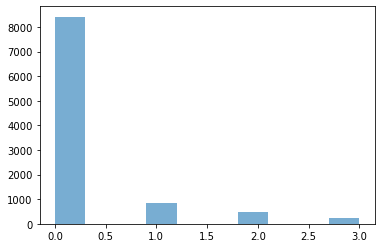

In [59]:
outliers_score_model_based = summary[['dbscan', 'svm', 'isolation']].sum(axis=1)
plt.hist(outliers_score_model_based, alpha=0.6);
outliers_score_model_based.value_counts()

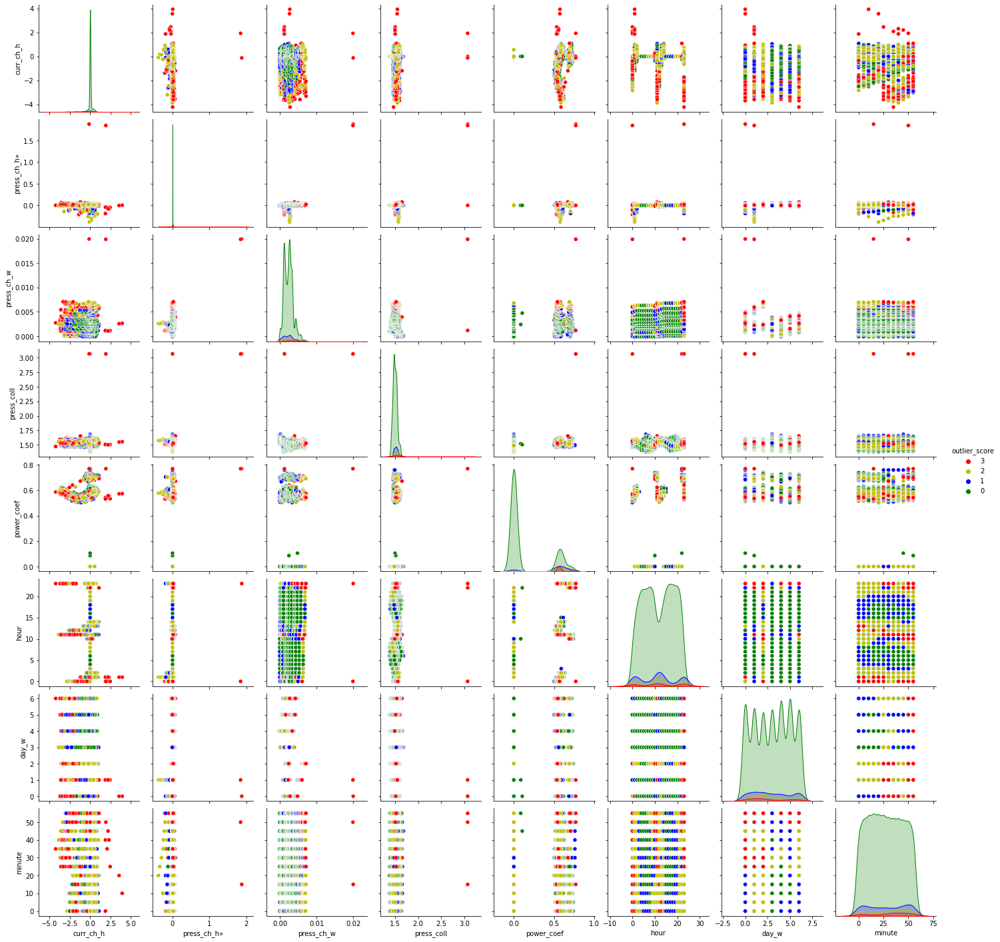

In [60]:
labeled_data = data_features.copy()

#мэппим два датафрейма с одинаковой формой, но разным индексом
outliers_score_model_based_index = list(zip(labeled_data.index, outliers_score_model_based))
outliers_score_model_based_index = pd.DataFrame(outliers_score_model_based_index).set_index(0)
outliers_score_model_based_index.rename(columns = {1: 'outlier_score'}, inplace = True)

labeled_data['outlier_score'] = outliers_score_model_based_index

custom_palette = {0:'g', 1:'b', 2:'y', 3:'r'}

sns.pairplot(data=labeled_data, vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

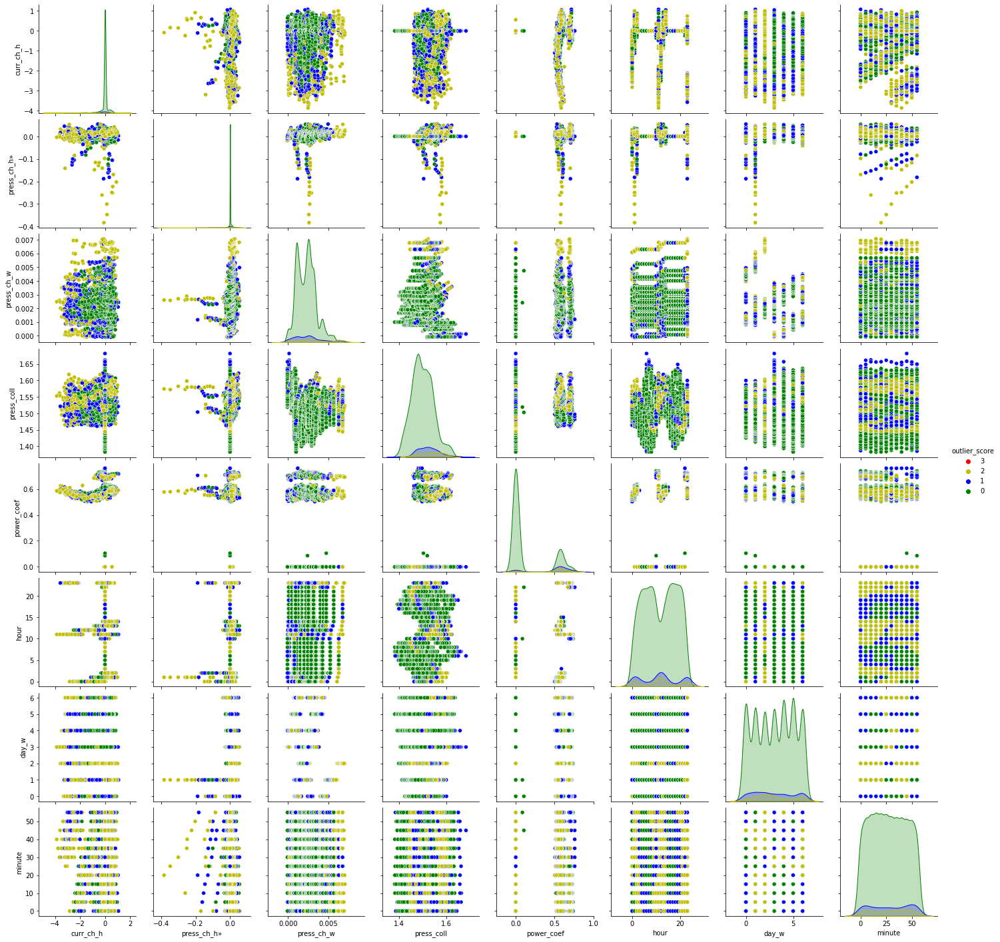

In [61]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score!=3],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

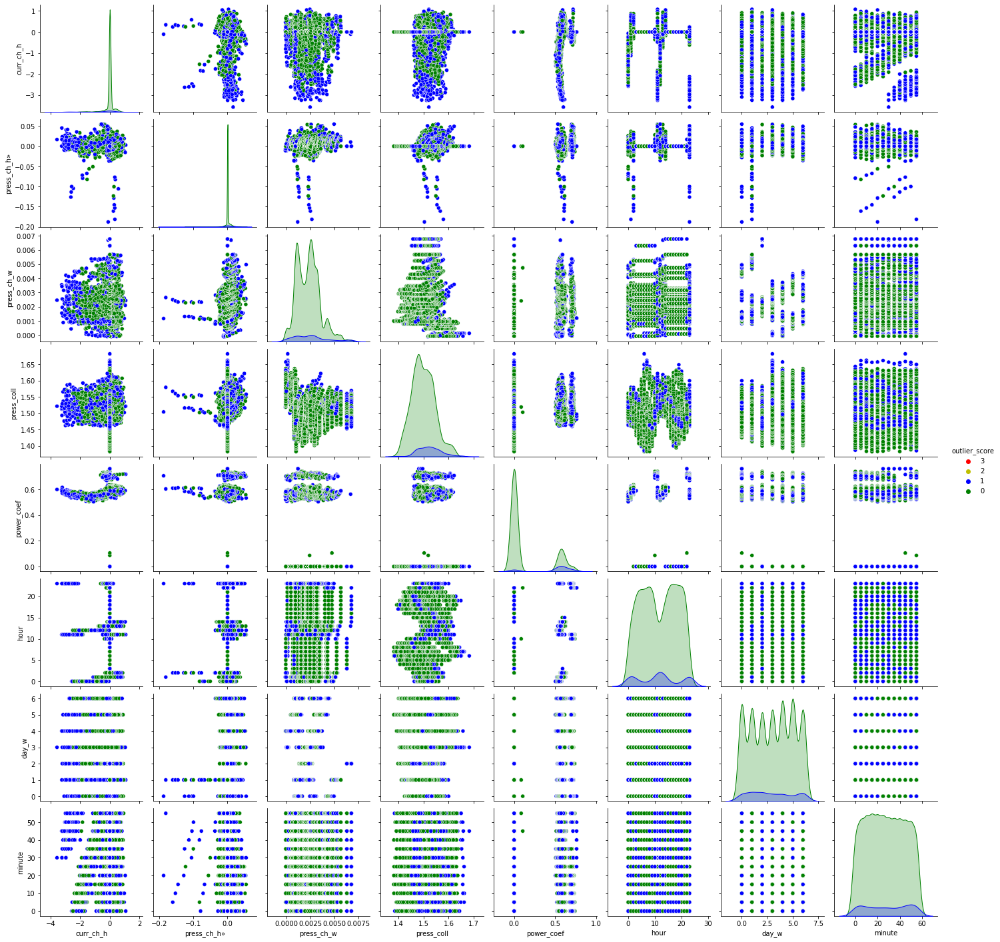

In [62]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score.isin([0, 1])],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

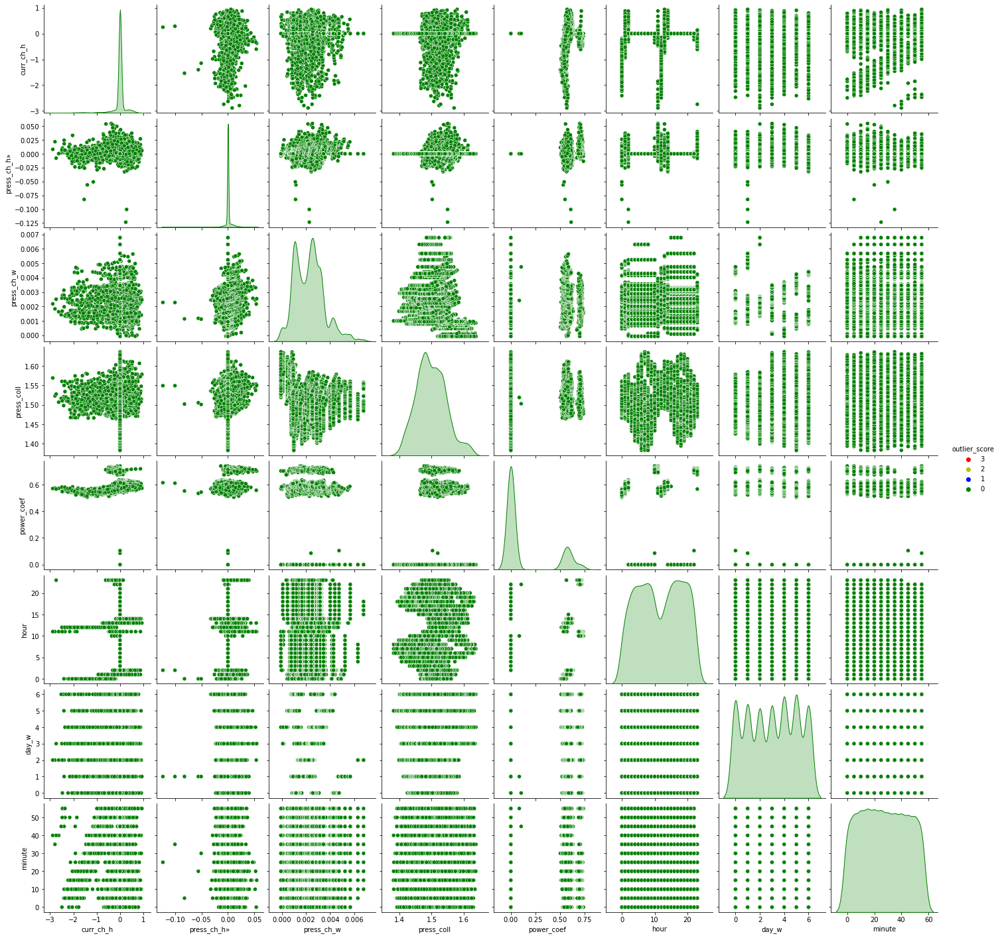

In [63]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score.isin([0])],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

# 6. Анализ данных по другим скважинам
[Содержание](#Содержание)

## 6.1 Сравнение с аномалиями целевого показателями (вне интервала 2-сигма)

In [83]:
def score_well(well,data_prep,sigm,vote=None):
    
    models_score = pd.DataFrame()

    data_one_id = data_prep.xs(well, level='WELL_ID')
    data_one_id = data_one_id.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)

    data_features = data_one_id.copy()

    comparison_table, std_outliers = get_column_outliers(data_features)

    comparison_table, iqr_outliers = get_column_outliers(data_features, function=outlier_iqr, 
                                                     columns=['engine','«engine_idle','workload_сh_w',
                                                              'curr_сh_d','curr_сh_w','press_сh_w',
                                                             'press_coll', 'workload_eng','curr',
                                                             'power_coef', 'hour', 'day_w', 'minute'])

    scaler = RobustScaler()
    scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features), 
            columns=data_features.columns
                    )

    euclidian_model = DistanceOutliers(metric='euclidean', percentile=90)
    euclidian_model.fit(scaled_data)
    euclidian_outliers = euclidian_model.predict(scaled_data)


    #DBSCAN
    # для начала считаем все наблюдения аномальными
    outlier_percentage = 1.

    num_clusters = []
    anomaly_percentage = []

    # берем маленький эпсилон и начинаем увеличивать
    eps = 0.05
    eps_history = [eps]
    while outlier_percentage>0.05:    
        model = DBSCAN(eps=eps).fit(scaled_data)
        labels = model.labels_
        num_clusters.append(len(np.unique(labels))-1)
        labels = np.array([1 if label == -1 else 0 for label in labels])
        # считаем текущий процент "шума"
        outlier_percentage = sum(labels==1) / len(labels)    
        eps += 0.05
        eps_history.append(eps)
        anomaly_percentage.append(outlier_percentage)

    model = DBSCAN(eps)
    model.fit(scaled_data)
    density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

    model = DBSCAN(1.3)
    model.fit(scaled_data)
    density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

    #SVM
    one_class_svm = OneClassSVM(nu=0.1, gamma='auto')
    one_class_svm.fit(scaled_data)
    svm_outliers = one_class_svm.predict(scaled_data)
    svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

    #Iforest
    isolation_forest = IsolationForest(n_estimators=100, contamination=0.1, 
                                       max_features=1.0, bootstrap=True, behaviour="new")
    isolation_forest.fit(scaled_data)

    isolation_outliers = isolation_forest.predict(scaled_data)
    isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

    summary = np.concatenate((
                    [std_outliers], 
                    [iqr_outliers], 
                    [euclidian_outliers], 
                    [density_outlier],
                    [svm_outliers],
                    [isolation_outliers]
                ))


    data_one_id_y = data_prep.xs(well, level='WELL_ID')
    data_one_id_y = data_one_id_y['targ_press_h']
    data_one_id_y = pd.DataFrame(data_one_id_y)
    
    print('well_id:',well)
    sigma_add(data_one_id_y)  


    data_one_id_y = data_one_id_y.reset_index()
    comparsion_with_y_outline = summary.copy()
    comparsion_with_y_outline = pd.DataFrame(comparsion_with_y_outline).T
    comparsion_with_y_outline.columns = ['std', 'iqr', 'euclid', 'dbscan', 'svm', 'isolation']
    comparsion_with_y_outline['2sigma'] = data_one_id_y['2sigma']
    comparsion_with_y_outline['3sigma'] = data_one_id_y['3sigma']
    
    if sigm == 3:
        for column in comparsion_with_y_outline.columns[:-2]:
            models_score = models_score.append({'well_id': well,
                                                'model_name': column,
                                                'accuracy_score': accuracy_score(comparsion_with_y_outline['3sigma'], comparsion_with_y_outline[column]),
                                                'recall_score': recall_score(comparsion_with_y_outline['3sigma'], comparsion_with_y_outline[column]),
                                                'f1_score': f1_score(comparsion_with_y_outline['3sigma'], comparsion_with_y_outline[column]),
                                                'precision_score': precision_score(comparsion_with_y_outline['3sigma'], comparsion_with_y_outline[column])}, ignore_index=True)
    elif sigm == 2:
         for column in comparsion_with_y_outline.columns[:-2]:
            models_score = models_score.append({'well_id': well,
                                                'model_name': column,
                                                'accuracy_score': accuracy_score(comparsion_with_y_outline['2sigma'], comparsion_with_y_outline[column]),
                                                'recall_score': recall_score(comparsion_with_y_outline['2sigma'], comparsion_with_y_outline[column]),
                                                'f1_score': f1_score(comparsion_with_y_outline['2sigma'], comparsion_with_y_outline[column]),
                                                'precision_score': precision_score(comparsion_with_y_outline['2sigma'], comparsion_with_y_outline[column])}, ignore_index=True)
    if sigm == None and vote != None:
        comparsion_vote = summary.copy()
        comparsion_vote = pd.DataFrame(comparsion_vote).T
        comparsion_vote.columns = ['std', 'iqr', 'euclid', 'dbscan', 'svm', 'isolation']
        comparsion_vote['anom_vote'] = np.where(comparsion_vote.sum(axis=1) >= vote, 1,0)
#         comparsion_vote.loc[comparsion_vote.anom_vote < vote, 'anom_vote'] = 0
#         comparsion_vote.loc[comparsion_vote.anom_vote >= vote, 'anom_vote'] = 1
        
        for column in comparsion_vote.columns[:-1]:
            models_score = models_score.append({'well_id': well,
                                                'model_name': column,
                                                'accuracy_score': accuracy_score(comparsion_vote['anom_vote'], comparsion_vote[column]),
                                                'recall_score': recall_score(comparsion_vote['anom_vote'], comparsion_vote[column]),
                                                'f1_score': f1_score(comparsion_vote['anom_vote'], comparsion_vote[column]),
                                                'precision_score': precision_score(comparsion_vote['anom_vote'], comparsion_vote[column])}, ignore_index=True)
    
    return models_score

In [65]:
%%time
all_wells_2sigm = pd.concat([score_well(well,data_prep,sigm=2) for well in wells[:]])
    

well_id: 226003330
 2sigma outlined: 0 of 9990 
 3sigma outlined: 0 of 9990
well_id: 226003074
 2sigma outlined: 807 of 9578 
 3sigma outlined: 9 of 9578
well_id: 226002627
 2sigma outlined: 976 of 9992 
 3sigma outlined: 323 of 9992
well_id: 226002307
 2sigma outlined: 316 of 9607 
 3sigma outlined: 259 of 9607
well_id: 226002148
 2sigma outlined: 273 of 3180 
 3sigma outlined: 160 of 3180
well_id: 226000198
 2sigma outlined: 766 of 9981 
 3sigma outlined: 14 of 9981
well_id: 226003080
 2sigma outlined: 539 of 9600 
 3sigma outlined: 7 of 9600
well_id: 226000297
 2sigma outlined: 800 of 9998 
 3sigma outlined: 0 of 9998
well_id: 226002603
 2sigma outlined: 529 of 9706 
 3sigma outlined: 500 of 9706
well_id: 226002861
 2sigma outlined: 765 of 9987 
 3sigma outlined: 359 of 9987
well_id: 226002416
 2sigma outlined: 110 of 9982 
 3sigma outlined: 17 of 9982
well_id: 226003316
 2sigma outlined: 16 of 9987 
 3sigma outlined: 0 of 9987
well_id: 226002998
 2sigma outlined: 684 of 8725 
 3sig

In [66]:
all_wells_2sigm

,well_id,model_name,accuracy_score,recall_score,f1_score,precision_score
0,226003330.0,std,0.928829,0.000000,0.000000,0.000000
1,226003330.0,iqr,0.978879,0.000000,0.000000,0.000000
2,226003330.0,euclid,0.900000,0.000000,0.000000,0.000000
3,226003330.0,dbscan,0.932432,0.000000,0.000000,0.000000
4,226003330.0,svm,0.900601,0.000000,0.000000,0.000000
...,...,...,...,...,...,...
1,226002142.0,iqr,0.862759,1.000000,0.462382,0.300714
2,226002142.0,euclid,0.850755,0.083051,0.061635,0.049000
3,226002142.0,dbscan,0.905472,0.194915,0.195745,0.196581
4,226002142.0,svm,0.870461,0.250847,0.186047,0.147852


In [67]:
models_all_wells_2sigma = all_wells_2sigm.groupby('model_name')['accuracy_score', 'recall_score', 'f1_score', 'precision_score'].mean()


models_all_wells_2sigma

,accuracy_score,recall_score,f1_score,precision_score
model_name,,,,
dbscan,0.932673,0.463731,0.370574,0.377446
euclid,0.909748,0.540132,0.373567,0.318218
iqr,0.899412,0.632764,0.381358,0.294385
isolation,0.916139,0.621800,0.413746,0.350176
std,0.921796,0.535878,0.406031,0.356381
svm,0.905561,0.529133,0.348761,0.297361


## 6.2 Сравнение с аномалиями целевого показателями (вне интервала 3-сигма)
[Содержание](#Содержание)

In [68]:
%%time
all_wells_3sigma = pd.concat([score_well(well,data_prep,sigm=3) for well in wells[:]])


well_id: 226003330
 2sigma outlined: 0 of 9990 
 3sigma outlined: 0 of 9990
well_id: 226003074
 2sigma outlined: 807 of 9578 
 3sigma outlined: 9 of 9578
well_id: 226002627
 2sigma outlined: 976 of 9992 
 3sigma outlined: 323 of 9992
well_id: 226002307
 2sigma outlined: 316 of 9607 
 3sigma outlined: 259 of 9607
well_id: 226002148
 2sigma outlined: 273 of 3180 
 3sigma outlined: 160 of 3180
well_id: 226000198
 2sigma outlined: 766 of 9981 
 3sigma outlined: 14 of 9981
well_id: 226003080
 2sigma outlined: 539 of 9600 
 3sigma outlined: 7 of 9600
well_id: 226000297
 2sigma outlined: 800 of 9998 
 3sigma outlined: 0 of 9998
well_id: 226002603
 2sigma outlined: 529 of 9706 
 3sigma outlined: 500 of 9706
well_id: 226002861
 2sigma outlined: 765 of 9987 
 3sigma outlined: 359 of 9987
well_id: 226002416
 2sigma outlined: 110 of 9982 
 3sigma outlined: 17 of 9982
well_id: 226003316
 2sigma outlined: 16 of 9987 
 3sigma outlined: 0 of 9987
well_id: 226002998
 2sigma outlined: 684 of 8725 
 3sig

In [69]:
models_all_wells_3sigma = all_wells_3sigma.groupby('model_name')['accuracy_score', 'recall_score', 'f1_score', 'precision_score'].mean() 

In [70]:
models_all_wells_3sigma

,accuracy_score,recall_score,f1_score,precision_score
model_name,,,,
dbscan,0.941200,0.476889,0.230016,0.192619
euclid,0.913739,0.554251,0.222138,0.161610
iqr,0.888572,0.563783,0.215113,0.151981
isolation,0.913527,0.585186,0.222154,0.160549
std,0.923391,0.499690,0.230811,0.176837
svm,0.910615,0.506341,0.200701,0.145377


## 6.3 Сравнение с аномалиями за которое проголосовало большинство
[Содержание](#Содержание)

0    7922
1     799
2     488
3     258
4     230
5     174
6     104
dtype: int64

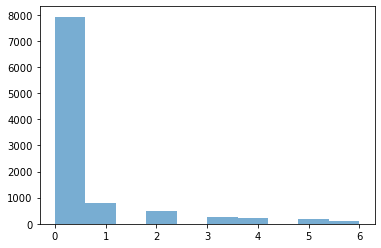

In [79]:
outliers_score_model_based = summary.sum(axis=1)
plt.hist(outliers_score_model_based, alpha=0.6);
outliers_score_model_based.value_counts()

<AxesSubplot:>

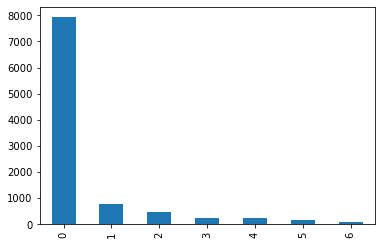

In [82]:
outliers_score_model_based.value_counts().plot(kind='bar')



In [84]:
well_2 = score_well(226000188,data_prep,sigm=None,vote=5)
well_2

well_id: 226000188
 2sigma outlined: 571 of 9975 
 3sigma outlined: 45 of 9975


,well_id,model_name,accuracy_score,recall_score,f1_score,precision_score
0,226000188.0,std,0.961704,0.964912,0.590129,0.425039
1,226000188.0,iqr,0.933233,0.824561,0.413732,0.276146
2,226000188.0,euclid,0.928521,1.000000,0.444271,0.285571
3,226000188.0,dbscan,0.966917,0.743860,0.562334,0.452026
4,226000188.0,svm,0.919298,0.842105,0.373541,0.240000
5,226000188.0,isolation,0.927920,0.989474,0.439595,0.282565


In [73]:
%%time
all_wells_vote = pd.concat([score_well(well,data_prep,sigm=None,vote=5) for well in wells[:]])


well_id: 226003330
 2sigma outlined: 0 of 9990 
 3sigma outlined: 0 of 9990
well_id: 226003074
 2sigma outlined: 807 of 9578 
 3sigma outlined: 9 of 9578
well_id: 226002627
 2sigma outlined: 976 of 9992 
 3sigma outlined: 323 of 9992
well_id: 226002307
 2sigma outlined: 316 of 9607 
 3sigma outlined: 259 of 9607
well_id: 226002148
 2sigma outlined: 273 of 3180 
 3sigma outlined: 160 of 3180
well_id: 226000198
 2sigma outlined: 766 of 9981 
 3sigma outlined: 14 of 9981
well_id: 226003080
 2sigma outlined: 539 of 9600 
 3sigma outlined: 7 of 9600
well_id: 226000297
 2sigma outlined: 800 of 9998 
 3sigma outlined: 0 of 9998
well_id: 226002603
 2sigma outlined: 529 of 9706 
 3sigma outlined: 500 of 9706
well_id: 226002861
 2sigma outlined: 765 of 9987 
 3sigma outlined: 359 of 9987
well_id: 226002416
 2sigma outlined: 110 of 9982 
 3sigma outlined: 17 of 9982
well_id: 226003316
 2sigma outlined: 16 of 9987 
 3sigma outlined: 0 of 9987
well_id: 226002998
 2sigma outlined: 684 of 8725 
 3sig

In [74]:
models_all_wells_vote = all_wells_vote.groupby('model_name')['accuracy_score', 'recall_score', 'f1_score', 'precision_score'].mean()
models_all_wells_vote

,accuracy_score,recall_score,f1_score,precision_score
model_name,,,,
dbscan,0.960731,0.756652,0.614558,0.581872
euclid,0.939275,0.930910,0.555789,0.431345
iqr,0.909479,0.847282,0.515926,0.425983
isolation,0.944401,0.977630,0.587587,0.456968
std,0.951971,0.932620,0.631659,0.513228
svm,0.942028,0.954658,0.572806,0.445884


In [75]:
models_accuracy_comp = pd.DataFrame()
models_accuracy_comp['2sigma'] = models_all_wells_2sigma['accuracy_score']
models_accuracy_comp['3sigma'] = models_all_wells_3sigma['accuracy_score']
models_accuracy_comp['vote'] = models_all_wells_vote['accuracy_score']

In [76]:
models_accuracy_comp

,2sigma,3sigma,vote
model_name,,,
dbscan,0.932673,0.941200,0.960731
euclid,0.909748,0.913739,0.939275
iqr,0.899412,0.888572,0.909479
isolation,0.916139,0.913527,0.944401
std,0.921796,0.923391,0.951971
svm,0.905561,0.910615,0.942028


In [77]:
models_accuracy_comp.T

model_name,dbscan,euclid,iqr,isolation,std,svm
2sigma,0.932673,0.909748,0.899412,0.916139,0.921796,0.905561
3sigma,0.941200,0.913739,0.888572,0.913527,0.923391,0.910615
vote,0.960731,0.939275,0.909479,0.944401,0.951971,0.942028


Найти похожий кейс, расставить ссылки 
google scholar
введение - актуальность
ссылка на учебник

1. уточнить, нужно ли прогнозировать target как задачу регрессии, или нужно также искать аномалии(ответ - да), 
2. если нужно искать аномалии, то что под ними понимать:
    2.1 выбросы по y (по изменению давления, те что выходит за усики boxplot (выброс)
    2.2 поиск по pycaret как задача unsupervized learning (новизна)
3. как решать как unsupervized или supervied, если supervized, как формировать разметку?
4. уточнить - качество смотреть финальное на валидационной выборке, как валидировать?
5. использовать ли id насоса как dummy переменную(как в панельной регрессии в эконометрике)





6. построить корреляционная матрица heatmap
7. убрать лишнее разделение на трейн тест, валидироваться на валидационной выборке
8. попробовать проанализировать выбросы EDA exploratory data analysis (разведочный анализ данных)